# Recreation of UNet
It is only for learning purposes: for CNNs and for Pytorch.

In [1]:
import os
import random
from PIL import Image
import torch
from torch import optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.utils.data import random_split
from tqdm import tqdm
from matplotlib import pyplot as plt
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.transforms import functional as F
import torch.nn.functional as Fu
from skimage.measure import label, regionprops
from skimage.morphology import convex_hull_image
import numpy as np
import cv2
from scipy import ndimage

print(torch.__version__)          # should show 2.8.0+cu126
print(torch.version.cuda)         # should show '12.6'
print(torch.cuda.is_available())  # should be True
print(torch.cuda.get_device_name(0))  # NVIDIA RTX A6000

2.8.0+cu126
12.6
True
NVIDIA RTX A6000


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
num_workers = 1

if device == "cuda":
    print("Using GPU")
    num_workers = torch.cuda.device_count() * 4
else:
    print("Using CPU")

generator = torch.Generator(device=device)

Using GPU


In [3]:
DATA_DIR = "data/"
DATASET_DIR = DATA_DIR + "optic_disk/"
TRAIN_DIR = DATASET_DIR + "train/"
TRAIN_MASKS_DIR = DATASET_DIR + "train_masks/"
LIMIT = None
AUGMENTED_IMAGES = 3

STATES_DIR = "states/"
MODEL_PATH = STATES_DIR + "optic_disk_12.pth"
IMAGE_SIZE = 1024

In [4]:
LEARNING_RATE = 1e-3
BATCH_SIZE = 8
EPOCHS = 120

## Dataset
Using Carvana dataset for testing (https://www.kaggle.com/c/carvana-image-masking-challenge)

### Get data

In [5]:
class GetDataset(Dataset):
    def __init__(self, root_path, limit=None):
        self.root_path = root_path
        self.limit = limit
        self.images = sorted([os.path.join(root_path, "train", i)
                              for i in os.listdir(root_path + "train/")])[:self.limit]
        self.masks = sorted([os.path.join(root_path, "train_masks", i)
                             for i in os.listdir(root_path + "train_masks/")])[:self.limit]

        # Basic resize + tensor
        self.base_transform = transforms.Compose([
            transforms.Pad(padding=(0, 0, 1, 1)),
            transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
            transforms.ToTensor(),
        ])

        if self.limit is None:
            self.limit = len(self.images)

    def __getitem__(self, index):
        img = Image.open(self.images[index]).convert("L")
        mask = Image.open(self.masks[index]).convert("L")

        # Apply base transform
        img = self.base_transform(img)
        mask = self.base_transform(mask)

        # Convert mask to binary
        mask = (mask > 0).float()

        return img, mask, self.images[index]

    def __len__(self):
        return min(len(self.images), self.limit)

In [6]:
class AugmentedDataset(Dataset):
    """
    Wraps a base dataset to return:
      - the original image
      - N augmented versions of it
    -> Dataset size = len(base_dataset) * (1 + num_augments)
    """
    def __init__(self, base_dataset, augment=True, num_augments=3):
        self.base_dataset = base_dataset
        self.augment = augment
        self.num_augments = num_augments

    def __len__(self):
        # Original + num_augments per image
        return len(self.base_dataset) * (1 + (self.num_augments if self.augment else 0))

    def __getitem__(self, idx):
        # Map idx to the original dataset
        orig_idx = idx % len(self.base_dataset)
        img, mask, path = self.base_dataset[orig_idx]

        if not self.augment:
            return img, mask, path

        # Index within group (0 = original, 1..num_augments = augmentations)
        group_idx = idx // len(self.base_dataset)

        if group_idx == 0:
            return img, mask, path
        else:
            img_aug, mask_aug = self.apply_augmentation(img, mask)
            return img_aug, mask_aug, f"{path}_aug{group_idx}"

    def apply_augmentation(self, img, mask):
        # Convert to PIL if needed
        if not isinstance(img, Image.Image):
            img = transforms.ToPILImage()(img)
        if not isinstance(mask, Image.Image):
            mask = transforms.ToPILImage()(mask)

        # Random rotation between -5 and 5 degrees
        angle = random.uniform(-5, 5)
        img = F.rotate(img, angle)
        mask = F.rotate(mask, angle)

        # Random flips
        if random.random() > 0.5:
            img = F.hflip(img)
            mask = F.hflip(mask)
        if random.random() > 0.5:
            img = F.vflip(img)
            mask = F.vflip(mask)

        # Random zoom / crop
        w, h = img.size
        scale = random.uniform(0.6, 1.0)
        new_w, new_h = int(w * scale), int(h * scale)
        left = random.randint(0, w - new_w)
        top = random.randint(0, h - new_h)
        img = F.crop(img, top, left, new_h, new_w)
        mask = F.crop(mask, top, left, new_h, new_w)

        # Resize back to original size
        img = F.resize(img, [h, w])
        mask = F.resize(mask, [h, w])

        # Convert back to tensor
        img = transforms.ToTensor()(img)
        mask = (transforms.ToTensor()(mask) > 0).float()

        return img, mask

In [7]:
def visualize_augmentations(dataset, n=5):
    """
    Visualize original and augmented images and masks from AugmentedDataset.
    Shows overlays for both augmentations.

    Args:
        dataset: instance of AugmentedDataset
        n: number of samples to show
    """
    if not isinstance(dataset, AugmentedDataset):
        raise ValueError("Dataset must be an AugmentedDataset to visualize augmentations")

    base_len = len(dataset.base_dataset)  # original dataset size
    indices = random.sample(range(base_len), n)  # pick from originals

    plt.figure(figsize=(20, n * 3))

    for i, idx in enumerate(indices):
        # Original
        orig_img, orig_mask, _ = dataset[idx]

        # First augmentation
        aug1_img, aug1_mask, _ = dataset[idx + base_len]

        # Second augmentation
        aug2_img, aug2_mask, _ = dataset[idx + 2 * base_len]

        # Convert to numpy
        orig_img = orig_img.squeeze().cpu().numpy()
        orig_mask = orig_mask.squeeze().cpu().numpy()
        aug1_img = aug1_img.squeeze().cpu().numpy()
        aug1_mask = aug1_mask.squeeze().cpu().numpy()
        aug2_img = aug2_img.squeeze().cpu().numpy()
        aug2_mask = aug2_mask.squeeze().cpu().numpy()

        # 1. Original image
        plt.subplot(n, 8, i * 8 + 1)
        plt.imshow(orig_img, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        # 2. Original mask
        plt.subplot(n, 8, i * 8 + 2)
        plt.imshow(orig_mask, cmap="gray")
        plt.title("Original Mask")
        plt.axis("off")

        # 3. Aug1 image
        plt.subplot(n, 8, i * 8 + 3)
        plt.imshow(aug1_img, cmap="gray")
        plt.title("Aug1 Image")
        plt.axis("off")

        # 4. Aug1 mask
        plt.subplot(n, 8, i * 8 + 4)
        plt.imshow(aug1_mask, cmap="gray")
        plt.title("Aug1 Mask")
        plt.axis("off")

        # 5. Aug1 overlay
        plt.subplot(n, 8, i * 8 + 5)
        plt.imshow(aug1_img, cmap="gray")
        plt.imshow(aug1_mask, cmap="Reds", alpha=0.2)
        plt.title("Aug1 Overlay")
        plt.axis("off")

        # 6. Aug2 image
        plt.subplot(n, 8, i * 8 + 6)
        plt.imshow(aug2_img, cmap="gray")
        plt.title("Aug2 Image")
        plt.axis("off")

        # 7. Aug2 mask
        plt.subplot(n, 8, i * 8 + 7)
        plt.imshow(aug2_mask, cmap="gray")
        plt.title("Aug2 Mask")
        plt.axis("off")

        # 8. Aug2 overlay
        plt.subplot(n, 8, i * 8 + 8)
        plt.imshow(aug2_img, cmap="gray")
        plt.imshow(aug2_mask, cmap="Reds", alpha=0.2)
        plt.title("Aug2 Overlay")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

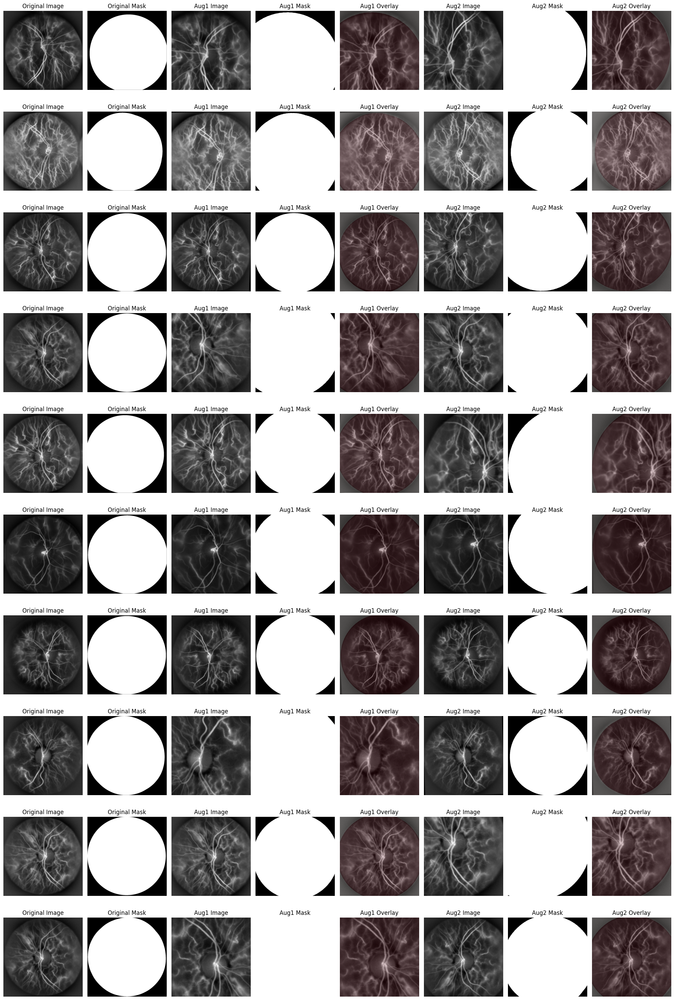

In [8]:
# Create base dataset
base_dataset = GetDataset(DATASET_DIR, LIMIT)

# Wrap with augmented dataset
train_dataset = AugmentedDataset(base_dataset, augment=True)

# Visualize 10 random samples
visualize_augmentations(train_dataset, n=10)

### Split and load it

In [8]:
# Create base dataset
base_dataset = GetDataset(DATASET_DIR, LIMIT)

# Wrap with augmented dataset
train_dataset = AugmentedDataset(base_dataset, augment=True, num_augments=AUGMENTED_IMAGES)

# Split into train/test/val
train_dataset, test_dataset = random_split(train_dataset, [0.8, 0.2])
test_dataset, val_dataset = random_split(test_dataset, [0.5, 0.5])

train_dataloader = DataLoader(dataset=train_dataset,
                              num_workers=0, pin_memory=False,
                              batch_size=BATCH_SIZE,
                              shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset,
                            num_workers=0, pin_memory=False,
                            batch_size=BATCH_SIZE,
                            shuffle=True)
test_dataloader = DataLoader(dataset=test_dataset,
                             num_workers=0, pin_memory=False,
                             batch_size=BATCH_SIZE,
                             shuffle=True)

## Cost functions

In [9]:
def dice(prediction, target, threshold=0.5, epsilon=1e-7):
    """
    Compute Dice coefficient for binary masks.
    Works for both single images [1,H,W] or batches [B,1,H,W].

    Args:
        prediction: torch.Tensor, probabilities or logits
        target: torch.Tensor, same shape as prediction, binary mask (0 or 1)
        threshold: threshold to binarize predictions
        epsilon: small value to avoid division by zero

    Returns:
        Dice coefficient (scalar)
    """
    # Convert predictions to binary
    prediction = (prediction > threshold).float()
    target = target.float()

    if prediction.dim() == 4:  # batch mode: [B, 1, H, W]
        intersection = torch.sum(prediction * target, dim=(1, 2, 3))
        union = torch.sum(prediction, dim=(1, 2, 3)) + torch.sum(target, dim=(1, 2, 3))
        dice_score = (2 * intersection + epsilon) / (union + epsilon)
        return dice_score.mean()  # mean over batch
    elif prediction.dim() == 3:  # single image: [1,H,W]
        intersection = torch.sum(prediction * target)
        union = torch.sum(prediction) + torch.sum(target)
        return (2 * intersection + epsilon) / (union + epsilon)
    else:
        raise ValueError(f"Unexpected tensor shape {prediction.shape}. Expected [1,H,W] or [B,1,H,W].")

In [10]:
def dice_loss(pred, target, epsilon=1e-7):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=(1,2,3))
    union = pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    return 1 - ((2 * intersection + epsilon) / (union + epsilon)).mean()

def combined_loss(pred, target, white_weight=20.0):
    bce = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([white_weight]).to(device))(pred, target)
    pred_sig = torch.sigmoid(pred)
    intersection = (pred_sig * target).sum()
    dice_loss = 1 - (2 * intersection + 1e-7) / (pred_sig.sum() + target.sum() + 1e-7)
    return bce + dice_loss

In [11]:
def free_cache():
    # release unused CUDA memory
    torch.cuda.empty_cache()

In [12]:
free_cache()

## UResNet

### Model

In [13]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels)
        )

        # To match dimensions for the skip connection if in/out channels differ
        self.shortcut = (
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
            if in_channels != out_channels else nn.Identity()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = self.shortcut(x)
        out = self.conv(x)
        out += residual
        return self.relu(out)

In [14]:
class DownResSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownResSample, self).__init__()
        self.conv = ResBlock(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        y = self.conv(x)
        p = self.pool(y)
        return y, p

In [15]:
class UpResSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpResSample, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = ResBlock(in_channels, out_channels)

    def forward(self, x1, x2):
        x2 = self.up(x2)
        x = torch.cat([x1, x2], dim=1)
        return self.conv(x)

In [16]:
class UResNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(UResNet, self).__init__()
        self.down_conv1 = DownResSample(in_channels, 64)
        self.down_conv2 = DownResSample(64, 128)
        self.down_conv3 = DownResSample(128, 256)
        self.down_conv4 = DownResSample(256, 512)

        self.bottle_neck = ResBlock(512, 1024)

        self.up_conv1 = UpResSample(1024, 512)
        self.up_conv2 = UpResSample(512, 256)
        self.up_conv3 = UpResSample(256, 128)
        self.up_conv4 = UpResSample(128, 64)

        self.out = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        s1, down1 = self.down_conv1(x)
        s2, down2 = self.down_conv2(down1)
        s3, down3 = self.down_conv3(down2)
        s4, down4 = self.down_conv4(down3)

        b = self.bottle_neck(down4)

        up1 = self.up_conv1(s4, b)
        up2 = self.up_conv2(s3, up1)
        up3 = self.up_conv3(s2, up2)
        up4 = self.up_conv4(s1, up3)

        return self.out(up4)

In [17]:
def load_model(path=MODEL_PATH):
    m = UResNet(in_channels=1, num_classes=1).to(device)
    m.load_state_dict(torch.load(path, map_location=torch.device(device)))
    return m

### Train

In [18]:
def train_uresnet(model, train_dataloader, val_dataloader, optimizer, combined_loss, dice,
                  device, epochs=20, save=True, path="best_model.pth",
                  use_scheduler=True, white_weight=20.0):
    t_losses, t_dcs, v_losses, v_dcs = [], [], [], []

    scaler = GradScaler(device)
    best_val_dc = -1.0
    best_epoch = -1

    # ---------------- Scheduler ----------------
    scheduler = None
    if use_scheduler:
        scheduler = ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=10)

    for epoch in range(epochs):
        # ---------------- TRAIN ----------------
        model.train()
        train_running_loss, train_running_dc = 0.0, 0.0

        for idx, (img, mask, _) in enumerate(tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs} [Train]")):
            img = img.float().to(device)      # [B,1,H,W]
            mask = mask.float().to(device)    # [B,1,H,W]

            optimizer.zero_grad()

            with autocast(device):  # mixed precision
                y_pred = model(img)
                loss = combined_loss(y_pred, mask)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # Dice for monitoring
            with torch.no_grad():
                dc = dice(y_pred, mask)

            train_running_loss += loss.item()
            train_running_dc += dc.item()

        train_loss = train_running_loss / (idx + 1)
        train_dc = train_running_dc / (idx + 1)
        t_losses.append(train_loss)
        t_dcs.append(train_dc)

        # ---------------- VALIDATION ----------------
        model.eval()
        val_running_loss, val_running_dc = 0.0, 0.0

        with torch.no_grad():
            for idx, (img, mask, _) in enumerate(tqdm(val_dataloader, desc=f"Epoch {epoch+1}/{epochs} [Val]")):
                img = img.float().to(device)
                mask = mask.float().to(device)

                with autocast(device):
                    y_pred = model(img)
                    loss = combined_loss(y_pred, mask, white_weight)

                dc = dice(y_pred, mask)

                val_running_loss += loss.item()
                val_running_dc += dc.item()

            val_loss = val_running_loss / (idx + 1)
            val_dc = val_running_dc / (idx + 1)
            v_losses.append(val_loss)
            v_dcs.append(val_dc)

        # ---------------- Scheduler Step ----------------
        if scheduler:
            scheduler.step(val_dc)  # because we want to maximize Dice

        # ---------------- LOGGING ----------------
        current_lr = optimizer.param_groups[0]['lr']
        print("-" * 40)
        print(f"Epoch {epoch+1}/{epochs} | LR: {current_lr:e}")
        print(f" Train Loss: {train_loss:.4f} | Train Dice: {train_dc:.4f}")
        print(f" Val Loss:   {val_loss:.4f} | Val Dice:   {val_dc:.4f}")
        print("-" * 40)

        # ---------------- CHECKPOINT ----------------
        if save and val_dc > best_val_dc:
            best_val_dc = val_dc
            best_epoch = epoch + 1
            torch.save(model.state_dict(), path)
            print(f"✅ New best model saved at epoch {best_epoch} with Dice {best_val_dc:.4f}")

    # ---------------- LOAD BEST ----------------
    if save and best_epoch > 0:
        model.load_state_dict(torch.load(path, map_location=device))
        print(f"🎯 Loaded best model from epoch {best_epoch} (Dice {best_val_dc:.4f})")

    return t_losses, t_dcs, v_losses, v_dcs

In [ ]:
model = None
if True: # Create new model or continue train existent one
    model = UResNet(in_channels=1, num_classes=1).to(device)
else:
    #LEARNING_RATE = 8e-5
    model = load_model(MODEL_PATH)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

free_cache()
t_losses, t_dcs, v_losses, v_dcs = train_uresnet(
    model=model,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    optimizer=optimizer,
    combined_loss=combined_loss,
    dice=dice,
    device=device,
    epochs=EPOCHS,
    save=True,
    path=MODEL_PATH,
    use_scheduler=True,
    white_weight=20.0
)
free_cache()

Epoch 1/120 [Train]:   0%|          | 0/322 [00:00<?, ?it/s]

In [21]:
# ✅ New best model saved at epoch 60 with Dice 0.9412 (numero 9)
free_cache()

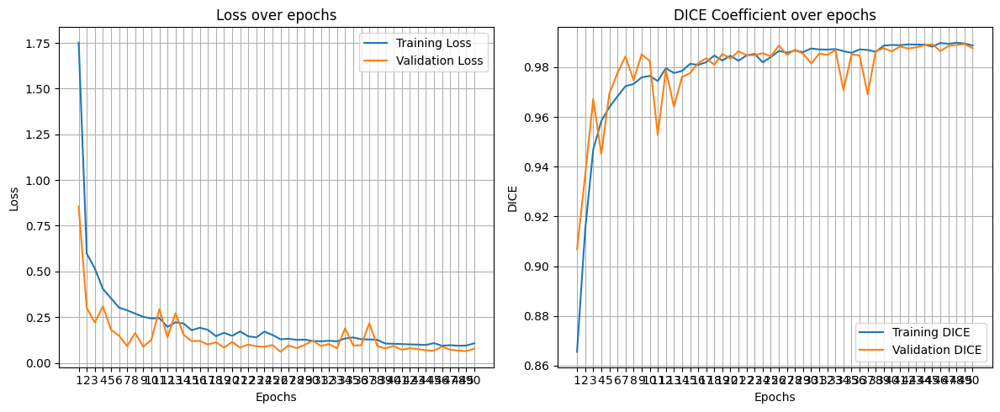

In [22]:
epochs_list = list(range(1, len(t_losses) + 1))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_list, t_losses, label='Training Loss')
plt.plot(epochs_list, v_losses, label='Validation Loss')
plt.xticks(ticks=list(range(1, len(t_losses) + 1, 1)))
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.tight_layout()

plt.legend()


plt.subplot(1, 2, 2)
plt.plot(epochs_list, t_dcs, label='Training DICE')
plt.plot(epochs_list, v_dcs, label='Validation DICE')
plt.xticks(ticks=list(range(1, len(t_losses) + 1, 1)))
plt.title('DICE Coefficient over epochs')
plt.xlabel('Epochs')
plt.ylabel('DICE')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

In [19]:
trained_model = load_model(MODEL_PATH)

In [20]:
test_running_loss = 0
test_running_dc = 0

with torch.no_grad():
    i = 0
    for _, img_mask in enumerate(tqdm(test_dataloader, position=0, leave=True)):
        img = img_mask[0].float().to(device)
        mask = img_mask[1].float().to(device)

        y_pred = trained_model(img)
        loss = combined_loss(y_pred, mask)
        dc = dice(y_pred, mask)

        test_running_loss += loss.item()
        test_running_dc += dc.item()
        i += 1

    test_loss = test_running_loss / i
    test_dc = test_running_dc / i

print(f'Loss: {test_loss:.4f}, DICE: {test_dc:.4f}')

100%|██████████| 41/41 [00:28<00:00,  1.43it/s]

Loss: 0.0839, DICE: 0.9581


In [21]:
n = 10

image_tensors = []
mask_tensors = []
image_paths = []

for _ in range(n):
    random_index = random.randint(0, len(test_dataloader.dataset) - 1)
    random_sample = test_dataloader.dataset[random_index]

    image_tensors.append(random_sample[0])
    mask_tensors.append(random_sample[1])
    image_paths.append(random_sample[2])

In [22]:
def res_random_images_inference(image_tensors, mask_tensors, image_paths, model_pth, device):
    """
    Show original images, ground truth masks, and model predictions.

    Args:
        image_tensors: list of torch tensors [C,H,W] or [1,H,W]
        mask_tensors: list of torch tensors [1,H,W]
        image_paths: list of image file paths (for titles)
        model_pth: path to saved model weights
        device: 'cuda' or 'cpu'
    """
    # Make sure model is instantiated
    model = UResNet(in_channels=1, num_classes=1).to(device)
    model.load_state_dict(torch.load(model_pth, map_location=device))
    model.eval()

    n = len(image_tensors)
    plt.figure(figsize=(12, 4 * n))

    with torch.no_grad():
        for i in range(n):
            img = image_tensors[i].unsqueeze(0).float().to(device)  # [1,1,H,W]
            mask = mask_tensors[i].cpu().squeeze().numpy()           # [H,W]

            # Forward pass
            pred = model(img)
            pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()  # [H,W], probs

            # Threshold to binary mask
            pred_mask_bin = (pred_mask > 0.5).astype(float)

            # Original image for plotting
            orig_img = img.cpu().squeeze().numpy()  # [H,W]

            # Plot
            plt.subplot(n, 3, i * 3 + 1)
            plt.imshow(orig_img, cmap='gray')
            plt.title(f"Original\n{image_paths[i].split('/')[-1]}")
            plt.axis('off')

            plt.subplot(n, 3, i * 3 + 2)
            plt.imshow(mask, cmap='gray')
            plt.title("Ground Truth Mask")
            plt.axis('off')

            plt.subplot(n, 3, i * 3 + 3)
            plt.imshow(pred_mask_bin, cmap='gray')
            plt.title(f"Predicted Mask\nDICE: {dice(torch.tensor(pred_mask_bin).unsqueeze(0),
                                        torch.tensor(mask).unsqueeze(0)):.4f}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

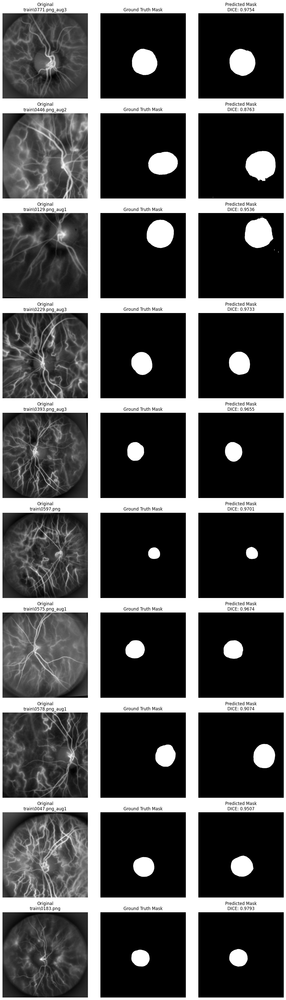

In [23]:
res_random_images_inference(image_tensors, mask_tensors, image_paths, MODEL_PATH, device)

In [24]:
def get_best_worst_samples(model, dataloaders, device, dice, n=10):
    """
    Evaluate model across multiple dataloaders (train, val, test, ...).
    Returns best/worst n samples globally based on Dice.

    Args:
        model: trained model
        dataloaders: list of dataloaders [train_dataloader, val_dataloader, test_dataloader]
        device: torch.device
        dice: function to compute dice score
        n: number of best/worst samples to return
    """
    model.eval()
    results = []  # will hold (dice_score, img, mask, path)

    with torch.no_grad():
        for loader in dataloaders:
            for img, mask, paths in tqdm(loader, desc="Evaluating"):
                img = img.float().to(device)
                mask = mask.float().to(device)

                y_pred = model(img)

                for b in range(img.size(0)):
                    dc_val = dice(y_pred[b:b+1], mask[b:b+1]).item()
                    results.append((dc_val, img[b].cpu(), mask[b].cpu(), paths[b]))

    # Sort by dice (ascending = worst first)
    results_sorted = sorted(results, key=lambda x: x[0])

    # Worst n
    worst_samples = results_sorted[:n]
    worst_image_tensors = [x[1] for x in worst_samples]
    worst_mask_tensors = [x[2] for x in worst_samples]
    worst_image_paths = [x[3] for x in worst_samples]

    # Best n
    best_samples = results_sorted[-n:][::-1]
    best_image_tensors = [x[1] for x in best_samples]
    best_mask_tensors = [x[2] for x in best_samples]
    best_image_paths = [x[3] for x in best_samples]

    return (
        worst_image_tensors,
        worst_mask_tensors,
        worst_image_paths,
        best_image_tensors,
        best_mask_tensors,
        best_image_paths,
    )

In [25]:
(
    worst_imgs,
    worst_masks,
    worst_paths,
    best_imgs,
    best_masks,
    best_paths,
) = get_best_worst_samples(trained_model,
                           [train_dataloader, val_dataloader, test_dataloader],
                           device,
                           dice,
                           n=10)

Evaluating: 100%|██████████| 41/41 [00:26<00:00,  1.52it/s]


Worst samples paths:


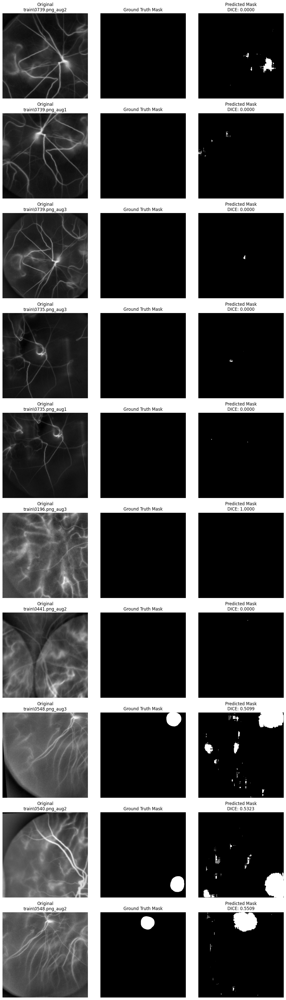

In [26]:
print("Worst samples paths:")
res_random_images_inference(worst_imgs, worst_masks, worst_paths, MODEL_PATH, device)

Best samples paths:


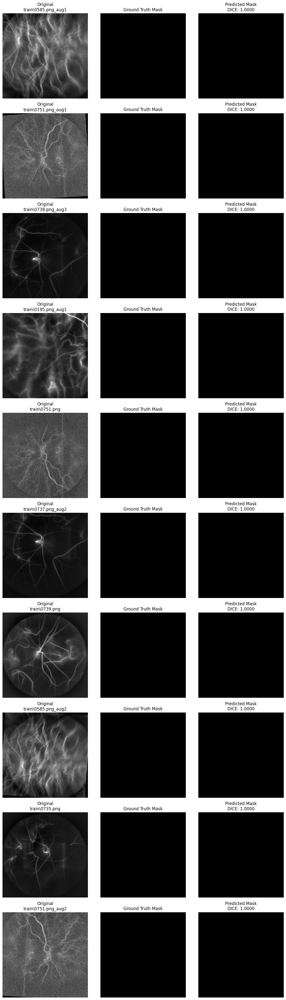

In [27]:
print("Best samples paths:")
res_random_images_inference(best_imgs, best_masks, best_paths, MODEL_PATH, device)

## Post-processing

### Connected

In [28]:
def keep_largest_convex_object(pred_mask: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Keeps only the largest convex object from a grayscale prediction tensor.

    Args:
        pred_mask: torch.Tensor of shape [1, H, W] or [H, W], values in [0,1]
        threshold: threshold to binarize prediction

    Returns:
        torch.Tensor of shape [1, H, W] with only the largest convex object
    """
    # Ensure numpy array
    mask = pred_mask.squeeze().detach().cpu().numpy()

    # Threshold to binary
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)  # no object detected

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)

    if not regions:
        return torch.zeros_like(pred_mask)

    # Find largest connected component
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Compute convex hull of the largest object
    convex_mask = convex_hull_image(largest_mask).astype(np.uint8)

    # Convert back to torch tensor
    convex_tensor = torch.from_numpy(convex_mask).unsqueeze(0).to(pred_mask.device).float()

    return convex_tensor

def keep_largest_smooth_convex(pred_mask: torch.Tensor, threshold=0.5, approx_epsilon=0.02):
    """
    Keep only the largest convex object with smooth approximation to avoid spikes.
    """
    mask = pred_mask.squeeze().detach().cpu().numpy()
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)
    if not regions:
        return torch.zeros_like(pred_mask)

    # Largest connected component
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(largest_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return torch.zeros_like(pred_mask)

    # Approximate contour to remove small bumps
    contour = contours[0]
    epsilon = approx_epsilon * cv2.arcLength(contour, True)  # fraction of perimeter
    approx_contour = cv2.approxPolyDP(contour, epsilon, True)

    # Convex hull of approximated contour
    hull = cv2.convexHull(approx_contour)

    # Fill hull
    convex_mask = np.zeros_like(largest_mask)
    cv2.fillConvexPoly(convex_mask, hull, 1)

    return torch.from_numpy(convex_mask).unsqueeze(0).to(pred_mask.device).float()

def keep_largest_connected_object(pred_mask: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Keep only the largest connected object from a grayscale prediction tensor.

    Args:
        pred_mask: torch.Tensor of shape [1,H,W] or [H,W], values in [0,1]
        threshold: threshold to binarize prediction

    Returns:
        torch.Tensor of shape [1,H,W] with only the largest connected object
    """
    # Convert to numpy
    mask = pred_mask.squeeze().detach().cpu().numpy()

    # Threshold to binary
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)  # no object detected

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)

    if not regions:
        return torch.zeros_like(pred_mask)

    # Keep only the largest region
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Convert back to torch tensor
    return torch.from_numpy(largest_mask).unsqueeze(0).to(pred_mask.device).float()

In [29]:
def smooth_and_fill_mask(mask: torch.Tensor,
                         kernel_size: int = 11,
                         sigma: float = 5.0,
                         threshold: float = 0.5,
                         fill_holes: bool = True) -> torch.Tensor:
    """
    Smooth a binary mask and optionally fill holes.

    Args:
        mask (torch.Tensor): Binary mask of shape [1, H, W] or [H, W], values 0 or 1.
        kernel_size (int): Size of Gaussian kernel for smoothing.
        sigma (float): Standard deviation of Gaussian blur.
        threshold (float): Threshold after smoothing.
        fill_holes (bool): Whether to fill holes inside the mask.

    Returns:
        torch.Tensor: Smoothed binary mask of shape [1, H, W].
    """
    if mask.ndim == 2:  # [H, W]
        mask = mask.unsqueeze(0)  # -> [1, H, W]
    elif mask.ndim != 3 or mask.shape[0] != 1:
        raise ValueError("Input must have shape [H, W] or [1, H, W]")

    H, W = mask.shape[-2:]

    # Add batch+channel dims for conv2d
    mask4d = mask.unsqueeze(0)  # -> [1,1,H,W]

    # Gaussian kernel
    x = torch.arange(kernel_size, device=mask.device) - kernel_size // 2
    gauss_1d = torch.exp(-x**2 / (2 * sigma**2))
    gauss_1d /= gauss_1d.sum()
    gauss_2d = (gauss_1d[:, None] * gauss_1d[None, :]).unsqueeze(0).unsqueeze(0)

    # Convolution (blur)
    smoothed = Fu.conv2d(mask4d.float(), gauss_2d, padding=kernel_size // 2)
    smoothed = (smoothed > threshold).float()

    # Back to [H, W] for hole filling
    result = smoothed.squeeze().cpu().numpy()
    if fill_holes:
        result = ndimage.binary_fill_holes(result).astype(float)

    # Return [1, H, W]
    return torch.from_numpy(result).to(mask.device).float().unsqueeze(0)

In [30]:
def evaluate_and_plot(trained_model, dataloader, device, num_samples=10):
    trained_model.eval()
    indices = random.sample(range(len(dataloader.dataset)), num_samples)

    results = []

    with torch.no_grad():
        for idx in indices:
            # Get one sample
            img, mask, _ = dataloader.dataset.__getitem__(idx)

            img = img.to(device)  # [1,H,W] or [C,H,W]
            mask = mask.to(device)  # [1,H,W]

            if img.dim() == 3:  # [C,H,W]
                img = img.unsqueeze(0)  # → [1,C,H,W]

            # Forward pass
            y_pred = trained_model(img)
            y_pred_sigmoid = torch.sigmoid(y_pred)

            # Thresholded raw prediction
            raw_mask = (y_pred_sigmoid[0] > 0.5).float()

            # Postprocessed masks
            pp_mask1 = keep_largest_connected_object(y_pred_sigmoid[0], threshold=0.5)
            pp_mask2 = smooth_and_fill_mask(pp_mask1, kernel_size=151, sigma=25.0, threshold=0.5, fill_holes=True)

            # Dice scores
            dice_raw = dice(raw_mask, mask[0])
            dice_connect = dice(pp_mask1, mask[0])
            dice_smooth = dice(pp_mask2, mask[0])

            results.append((img.cpu(), mask.cpu(), y_pred_sigmoid.cpu(),
                            raw_mask.cpu(), pp_mask1.cpu(), pp_mask2.cpu(),
                            dice_raw, dice_connect, dice_smooth))

    # Plotting
    fig, axes = plt.subplots(num_samples, 5, figsize=(15, 3*num_samples))

    for i, (img, mask, y_pred_sigmoid, raw_mask, pp_mask1, pp_mask2,
            dice_raw, dice_connect, dice_smooth) in enumerate(results):

        # If grayscale, squeeze channel
        image_disp = img[0,0].numpy() if img.shape[1] == 1 else img[0].permute(1,2,0).numpy()

        axes[i,0].imshow(mask[0], cmap="gray")
        axes[i,0].set_title("Ground truth")
        axes[i,0].axis("off")

        axes[i,1].imshow(y_pred_sigmoid[0,0], cmap="gray")
        axes[i,1].set_title("Raw pred")
        axes[i,1].axis("off")

        axes[i,2].imshow(raw_mask[0], cmap="gray")
        axes[i,2].set_title(f"Thresh\nDice={dice_raw:.3f}")
        axes[i,2].axis("off")

        axes[i,3].imshow(pp_mask1[0], cmap="gray")
        axes[i,3].set_title(f"Connected\nDice={dice_connect:.3f}")
        axes[i,3].axis("off")

        axes[i,4].imshow(pp_mask2[0], cmap="gray")
        axes[i,4].set_title(f"Smoothed\nDice={dice_smooth:.3f}")
        axes[i,4].axis("off")

    plt.tight_layout()
    plt.show()

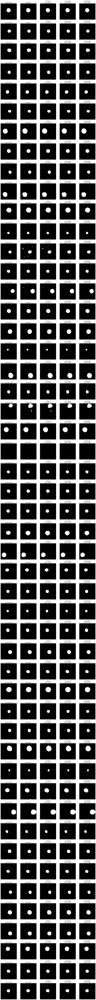

In [31]:
evaluate_and_plot(trained_model, test_dataloader, device, num_samples=50)

Dice (raw prediction):     0.8629
Dice (largest convex obj): 0.8476


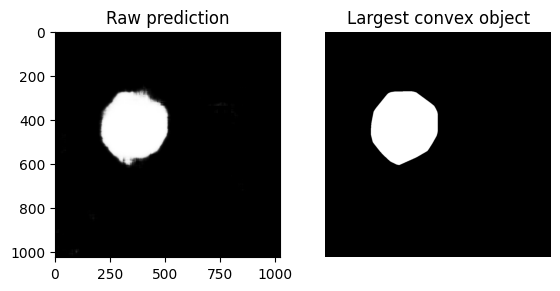

<Figure size 8000x10000 with 0 Axes>

In [44]:
img, mask, _ = test_dataloader.dataset.__getitem__(0)

# Forward pass
with torch.no_grad():
    img = img.to(device)      # [1,1,H,W]
    mask = mask.to(device)    # ground truth [1,1,H,W]

    if img.dim() == 3:  # [C, H, W]
        img = img.unsqueeze(0)  # → [1, C, H, W]

    # Prediction
    y_pred = trained_model(img)
    y_pred_sigmoid = torch.sigmoid(y_pred)

    # Threshold raw prediction
    raw_mask = (y_pred_sigmoid[0] > 0.5).float()

    # Postprocessed convex mask
    convex_mask = keep_largest_convex_object(y_pred_sigmoid[0], threshold=0.5)

    # Dice scores
    dice_raw = dice(raw_mask, mask[0])
    dice_convex = dice(convex_mask, mask[0])

print(f"Dice (raw prediction):     {dice_raw:.4f}")
print(f"Dice (largest convex obj): {dice_convex:.4f}")

# Convert to numpy for visualization
plt.subplot(1,2,1)
plt.imshow(y_pred_sigmoid[0,0].cpu(), cmap="gray")
plt.title("Raw prediction")

plt.subplot(1,2,2)
plt.imshow(convex_mask[0].cpu(), cmap="gray")
plt.title("Largest convex object")
plt.show()


In [46]:
def get_best_worst_connected_samples(model, dataloaders, device, dice, n=10, threshold=0.5):
    """
    Compare Dice before and after connected postprocessing using keep_largest_connected_object.
    Returns the best and worst n examples (largest improvement vs largest drop).

    Each sample includes:
      - input image
      - ground truth mask
      - predicted mask
      - dice_raw
      - connected_predicted_mask
      - dice_connected
      - image path
    """
    model.eval()
    results = []  # list of dicts

    with torch.no_grad():
        for loader in dataloaders:
            for img, mask, paths in tqdm(loader, desc="Evaluating Connected Postprocess"):
                img = img.float().to(device)
                mask = mask.float().to(device)

                with autocast(device):
                    y_pred = model(img)

                # Iterate over batch images
                for b in range(img.size(0)):
                    # --- ground truth
                    gt = mask[b:b+1]

                    # --- raw pred
                    raw_pred = (y_pred[b:b+1] > threshold).float()
                    dice_raw = dice(raw_pred, gt.to(raw_pred.device)).item()

                    # --- connected postprocess using your function
                    connected_pred = keep_largest_connected_object(raw_pred, threshold=threshold)
                    dice_connected = dice(connected_pred, gt.to(connected_pred.device)).item()

                    # --- store sample
                    results.append({
                        "image": img[b].cpu(),
                        "mask_gt": gt.cpu(),
                        "pred_raw": raw_pred.cpu(),
                        "dice_raw": dice_raw,
                        "pred_connected": connected_pred.cpu(),
                        "dice_connected": dice_connected,
                        "path": paths[b],
                        "delta": dice_connected - dice_raw
                    })

    # sort by delta dice
    results_sorted = sorted(results, key=lambda x: x["delta"])

    # Worst n (biggest drops)
    worst_samples = results_sorted[:n]

    # Best n (biggest improvements)
    best_samples = results_sorted[-n:][::-1]

    return worst_samples, best_samples

In [47]:
def visualize_worst_best_samples(worst_samples, best_samples, n_per_row=4):
    """
    Visualize worst and best connected postprocessing samples.

    Each row shows: [Input, GT Mask, Raw Pred, Convex Pred]
    Worst samples are displayed first, then best samples.
    """
    all_samples = [("WORST", worst_samples), ("BEST", best_samples)]

    for label, samples in all_samples:
        n_samples = len(samples)
        plt.figure(figsize=(n_per_row*4, n_samples*4))
        plt.suptitle(f"{label} Samples (Connected Postprocessing)", fontsize=16)

        for i, sample in enumerate(samples):
            images_to_show = [
                (sample["image"].squeeze().cpu().numpy(), "Input Image"),
                (sample["mask_gt"].squeeze().cpu().numpy(), "GT Mask"),
                (sample["pred_raw"].squeeze().cpu().numpy(), f"Raw Pred\nDice: {sample['dice_raw']:.3f}"),
                (sample["pred_connected"].squeeze().cpu().numpy(), f"Connected Pred\nDice: {sample['dice_connected']:.3f}")
            ]

            for j, (img, title) in enumerate(images_to_show):
                plt.subplot(n_samples, n_per_row, i*n_per_row + j + 1)
                plt.imshow(img, cmap="gray")
                plt.title(title, fontsize=10)
                plt.axis("off")

        plt.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()

Evaluating Connected Postprocess: 100%|██████████| 41/41 [00:21<00:00,  1.94it/s]


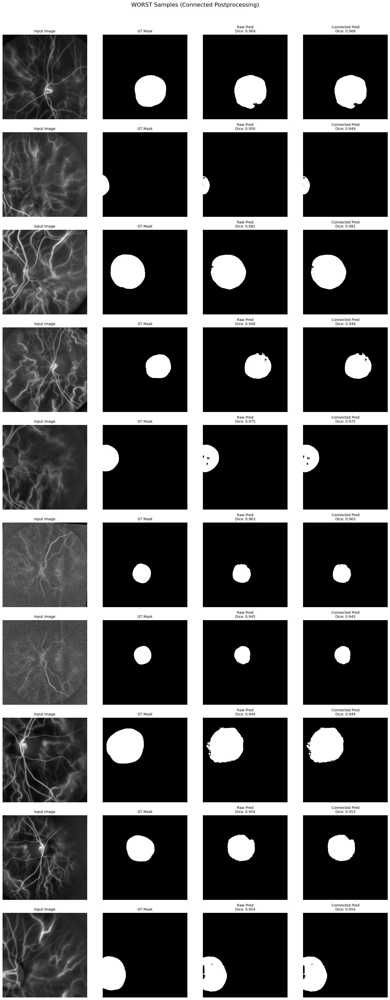

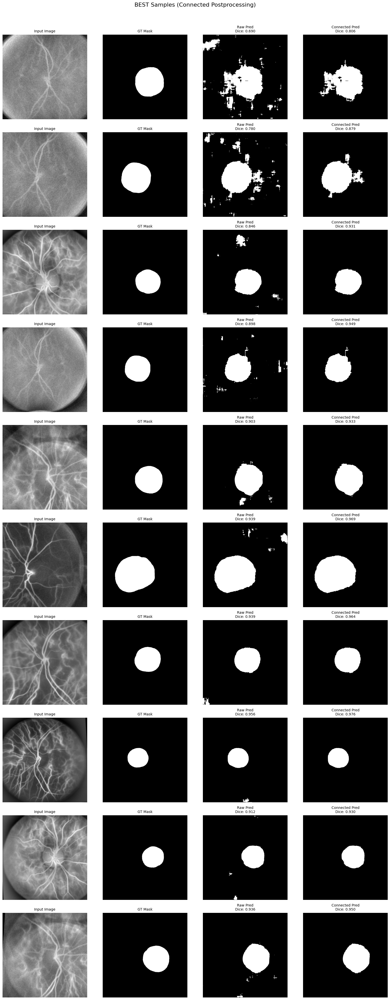

In [48]:
worst_samples, best_samples = get_best_worst_connected_samples(
    trained_model,
    [train_dataloader, val_dataloader, test_dataloader],
    device,
    dice,
    n=10,
    threshold=0.5
)

visualize_worst_best_samples(worst_samples, best_samples)

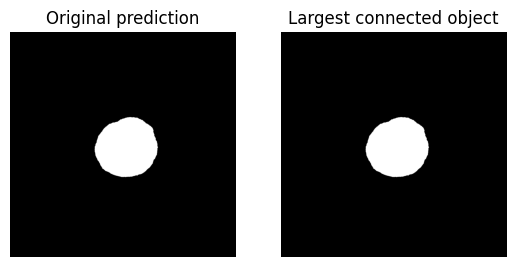

In [36]:
# grayscale prediction mask from model
pred_mask = raw_mask[0]  # shape [1,H,W]
largest_obj_mask = keep_largest_connected_object(pred_mask, threshold=0.5)

# visualize
plt.subplot(1,2,1)
plt.imshow(pred_mask.squeeze().cpu(), cmap="gray")
plt.title("Original prediction")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(largest_obj_mask.squeeze().cpu(), cmap="gray")
plt.title("Largest connected object")
plt.axis("off")
plt.show()

In [37]:
def eval_image(model, image_path: str, device: torch.device):
    """
    Forward pass on a single image and keep only the largest connected object.

    Args:
        model: trained PyTorch model
        image_path: path to the input image (str)
        device: torch.device ("cuda" or "cpu")

    Returns:
        torch.Tensor of shape [1,H,W] -> largest connected object mask
    """
    model.eval()

    # Preprocessing (same as your dataset)
    transform = transforms.Compose([
        transforms.Pad(padding=(0, 0, 1, 1)),  # because base image is 1023 x 1023
        transforms.Resize((1024, 1024)),
        transforms.ToTensor()
    ])

    # Load image
    img = Image.open(image_path).convert("L")
    img_tensor = transform(img).unsqueeze(0).to(device)  # add batch dim

    # Forward pass
    with torch.no_grad():
        pred = model(img_tensor)

    # Remove batch dimension -> shape [1,H,W]
    pred_mask = pred.squeeze(0)

    # Apply largest object filter
    largest_mask = keep_largest_connected_object(pred_mask, threshold=0.5)

    return largest_mask

In [45]:
def visualize_prediction(model, image_path: str, device):
    """
    Runs forward pass on an image, keeps only the largest connected object,
    and visualizes input vs. mask side by side.
    """
    # Predict
    mask = eval_image(model, image_path, device)

    # Reload the original image
    orig_img = Image.open(image_path).convert("L")

    # Plot side by side
    plt.figure(figsize=(8, 4))

    # Left: original image
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    # Right: predicted mask (largest object)
    plt.subplot(1, 2, 2)
    plt.imshow(mask.squeeze().cpu(), cmap="gray")
    plt.title("Largest Connected Object")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

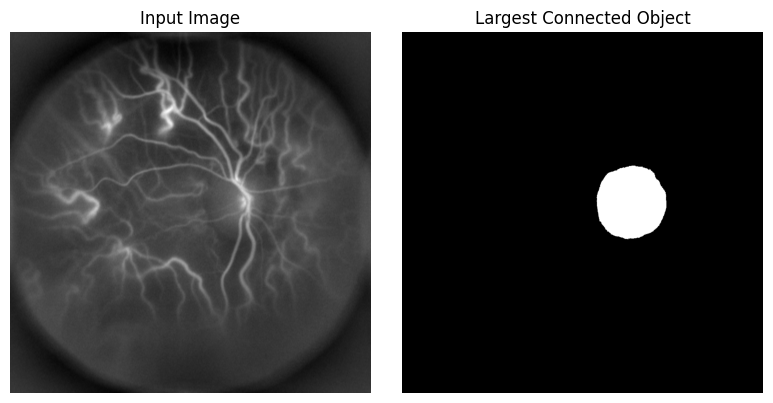

In [51]:
#mask = eval_image(trained_model, TRAIN_DIR + "0001.png", device)

visualize_prediction(trained_model, TRAIN_DIR + "0675.png", device)

In [ ]:
edge_cases = [
    195,
    196,
    197,
    201,
    212,
    250,
    258,
    282,
    289,
    351,
    368,
    369,
    370,
    371,
    382,
    402,
    403,
    404,
    414,
    415,
    417,
    418,
    419,
    436,
    441,
    462,
    463,
    464,
    514,
    525,
    526,
    527,
    528,
    529,
    530,
    531,
    532,
    533,
    534,
    535,
    536,
    537,
    569,
    570,
    571,
    585,
    595,
    596,
    597,
    680,
    683,
    715,
    733,
    735,
    736,
    737,
    738,
    739,
    740,
    748,
    751,
    767,

]